# <a href="https://thetahat.ru/courses/ad" target="_top">Введение в анализ данных</a>
## Домашнее задание 7. Кластеризация и понижение размерности

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@thetahat_ds25_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**. Если вы строите интерактивные графики, их стоит прислать в формате html.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания всем участникам списывания дается штраф -2 балла к итоговой оценке за семестр.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Обратите внимание на <a href="https://thetahat.ru/courses/ai-rules"><b>правила использования ИИ-инструментов</b></a> при решении домашнего задания.
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Решение проверяется системой ИИ-проверки <a href="https://thetahat.ru/"><img src="https://miptstats.github.io/theta_grader_small.png" style="display: inline; vertical-align: middle;"></a> **ThetaGrader**. Результат проверки валидируется и исправляется человеком, после чего комментарии отправляются студентам.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Правила оформления теоретических задач:**

* Решения необходимо оформить в виде $\LaTeX$ в markdown-ячейках. Иные способы (в т.ч. фотографии) не принимаются.
* Если вы не знаете $\LaTeX$, используйте ИИ-инструменты для оформления черновика решения. Примеры были показаны на лекции 2 по ИИ-инструментам.
* **В решениях поясняйте, чем вы пользуетесь**, хотя бы кратко. 
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.


<b><font size="5" color="red">Важно!!! Правила заполнения ноутбука:</font></b>
* Запрещается удалять имеющиеся в ноутбуке ячейки, менять местами положения задач.
* Сохраняйте естественный линейный порядок повествования в ноутбуке сверху-вниз.
* Отвечайте на вопросы, а также добавляйте новые ячейки в предложенных местах, которые обозначены `...`.
* В markdown-ячейка, содержащих описание задачи, находятся специальные отметки, которые <font color="red"><b>запрещается модифицировать</b></font>.
* При нарушении данных правил работа может получить 0 баллов.

**Баллы за задание:**

* Задача 1 &mdash; 30 баллов
* Задача 2 &mdash; 30 баллов
* Задача 3 &mdash; 120 баллов

Баллы учитываются в <b><font color="green">факультативной части</font></b> курса и не влияют на оценку по основной части.

In [21]:
# Bot check

# HW_ID: fpmi_ad7
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status:  final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

При необходимости установите библиотеку-расширение для `plotly`, позволяющую рисовать картинки на всплывающих окнах.

    pip install dash

In [22]:
import io
import os
import base64

import numpy as np
import pandas as pd
from tqdm.cli import tqdm

import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import plotly
import plotly.express as px
from dash import Dash, dcc, html, Input, Output, no_update, callback

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import torch
from transformers import ViTImageProcessor, ViTModel
from PIL import Image
import requests
from typing import Optional

# Load model directly
from transformers import AutoImageProcessor, AutoModel

sns.set_theme(style="darkgrid", palette="Set2")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
model = AutoModel.from_pretrained("google/vit-base-patch16-224-in21k")


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


<font size="4"><b>Внимание! Файл с решением может быть тяжелым. Если он весит 20 Мб и более, заранее разделите его на несколько частей.</b></font>

---
### Задача 1. 

Докажите, что метод KMeans для евклидовой метрики делит все пространство объектов на выпуклые многоугольники, возможно, неограниченные.

Можно использовать теоремы и свойства, которые у вас были ранее на обязательных курсах (но не курсах по выбору). При этом нужно привести четкое обоснование, как вы пользуетесь соответствующими свойствами, привести все обозначения.

Вот более формальный и строго обоснованный вариант твоего доказательства — с сохранением логики и идеи, но приведённый в строгой математической форме с опорой на известные свойства:

---

### **Доказательство: KMeans с евклидовой метрикой порождает диаграмму Вороного, области которой выпуклы**

После сходимости метода KMeans каждая точка $ x \in \mathbb{R}^d $ относится к тому кластеру, чей центр $ \mu_k $ минимизирует расстояние:

$
f(x) = \arg \min_{1 \leq j \leq K} \|x - \mu_j\|^2
$

Рассмотрим множество точек, отнесённых к фиксированному кластеру с центром $ \mu_k $. Оно имеет вид:

$
C_k = \left\{ x \in \mathbb{R}^d \mid \|x - \mu_k\|^2 < \|x - \mu_j\|^2,\ \forall j \neq k \right\}
$

Для каждого $ j \neq k $ неравенство $ \|x - \mu_k\|^2 < \|x - \mu_j\|^2 $ можно преобразовать следующим образом:

$
\|x - \mu_k\|^2 - \|x - \mu_j\|^2 < 0
$

Раскроем скобки:
$
(x - \mu_k)^T(x - \mu_k) - (x - \mu_j)^T(x - \mu_j) < 0
\Rightarrow
2x^T(\mu_j - \mu_k) + \|\mu_k\|^2 - \|\mu_j\|^2 < 0
$

Это — линейное неравенство по переменной $ x $, задающее **открытое полупространство**. Значит, множество $ C_k $ задаётся как **пересечение конечного числа линейных полупространств**, а потому является **выпуклым множеством**.

Таким образом, разбиение пространства, порождённое функцией $ f $, представляет собой **диаграмму Вороного**, построенную по центрам $ \mu_1, \dots, \mu_K $, причём каждая область диаграммы является **выпуклым (возможно, неограниченным) многоугольником** (в $\mathbb{R}^2$) или **выпуклым полиэдром** (в $\mathbb{R}^d$).

Из курса дискретной , что **диаграмма Вороного для конечного набора точек в евклидовом пространстве разбивает пространство на выпуклые области**, определяемые множествами точек, ближайших к каждому генератору. Ч.Т.Д.


---
### Задача 2. 

Как мы знаем из <a href="https://thetahat.ru/files/ad/main/7/lec7.pdf" target="_top">лекции</a>, в пространствах большой размерности расстояния между случайными объектами становятся неинформативными. Эта проблема известна как *проклятие размерности*, и она влечет соответствующие ограничения на использование методов, основанных на использовании расстоянии между объектами.

В этой задаче предлагается промоделировать ситуацию понижения размерности. Сгенерируйте достаточно большое количество точек в единичном кубе в пространстве некоторой размерности. Пример кода дан ниже

In [23]:
sample_size = 1000
dimention = 100
sample = np.random.uniform(size=(sample_size, dimention))

Повторите генерацию для нескольких размерностей пространства от 2 до 1000. Используйте не менее 7 различных значений размерностей пространства.

In [24]:
dimention = np.arange(start=2,stop =1000, step = 99)
samples = []
for dim in dimention:
  sample = np.random.uniform(size=(sample_size, dim))
  samples.append(sample)


Для каждой размерности посчитайте норму каждой точки, тем самым получая набор значений расстояния от 0 до случайной точки. Нормируйте все расстояния, поделив на среднее полученных расстояний для каждой размерности пространства.

In [25]:
normed = []
for s in samples:
    norms = np.linalg.norm(s, axis=1)
    mean_norm = np.mean(norms)
    normed.append(norms / mean_norm)

Нарисуйте на одном графике гистограммы или <a href="https://thetahat.ru/courses/python/07" target="_top">KDE-оценки плотности</a> нормированных расстояний для каждой размерности пространства. Не забывайте поддерживать информативность графиков.

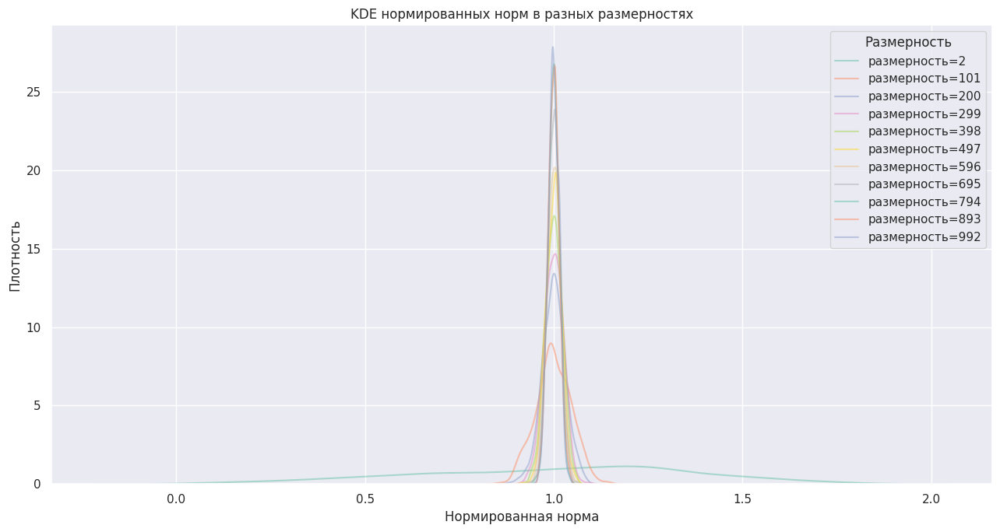

In [39]:
plt.figure(figsize=(13, 7))
for arr, dim in zip(normed, dimention):
    sns.kdeplot(arr,
                label=f"размерность={dim}",
                alpha=0.5)
plt.title("KDE нормированных норм в разных размерностях")
plt.xlabel("Нормированная норма")
plt.ylabel("Плотность")
plt.legend(title="Размерность")
plt.grid(True)
plt.tight_layout()
plt.show()

Сделайте выводы

С увеличением размерности у нас увеличивается дисперсия, что объясняет проклятие размерности. Откуда можно сделать вывод, что евклидово расстояние не является хорошей метрикой в пространствах достаточно большой размерности


---
### Задача 3.

> *Возможно, эту задачу будет оптимальнее сделать в отдельном файле или после перезапуска ядра. Если не хватает оперативки, попробуйте использовать более простые модели. Если все равно не помогает &mdash; спросите в чате.*

В этой задаче мы попробуем кластеризовать различными способами изображения котиков из датасета с <a href="https://thetahat.ru/courses/ad/main/7/pca" target="_top">семинара</a>.

Скачайте данные, загрузите их и отрисуйте несколько примеров. Если вы используете Colab, оптимальнее всего будет закинуть zip-архив `cats.zip` в файловое пространство (кнопка папки на левой панели) и распаковать его с помощью `!unzip cats.zip`.

Размерность cats: (15747, 12288)


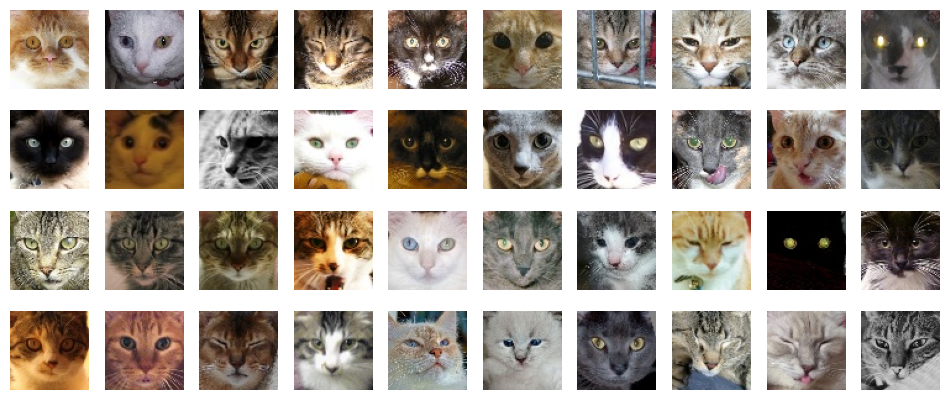

In [41]:
# Загружаем картинки
image_path = "cats"
cats = []

for filename in os.listdir(image_path):
    cats.append(plt.imread(os.path.join(image_path, filename)))

cats = np.stack(cats).reshape(-1, 64 * 64 * 3)
print(f"Размерность cats: {cats.shape}")

# Визуализируем примеры
plt.figure(figsize=(12, 5))
for i in range(40):
    plt.subplot(4, 10, i + 1)
    plt.imshow(cats[i].reshape(64, 64, 3))
    plt.axis("off")

#### 1. Свойства метрики в пространстве котиков

Прежде всего давайте исследуем, наблюдается ли проблема проклятия размерности в пространстве котиков, фактически повторив исследование предыдущей задачи. Для этого выберите не менее 10000 случайных пар изображений и посчитайте расстояния между ними. Визуализируйте гистограмму или <a href="https://thetahat.ru/courses/python/07" target="_top">KDE-оценку плотности</a> нормированных расстояний.

Повторите те же действия к результату применения PCA, рассмотрев разное количество компонент, например, для 30, 100 и 500. Обратите внимание, что PCA нужно обучать на всех изображениях, а не только для тех, для которых вы будете считать расстояния. Примеры обучения PCA можно посмотреть в <a href="https://thetahat.ru/courses/ad/main/7/pca" target="_top">ноутбуке</a> с занятия.

In [28]:
#Нормирование растояний
def normalized_distance(distances):
    normalized_distance = distances / np.mean(distances)
    return normalized_distance

Text(0, 0.5, 'Плотность')

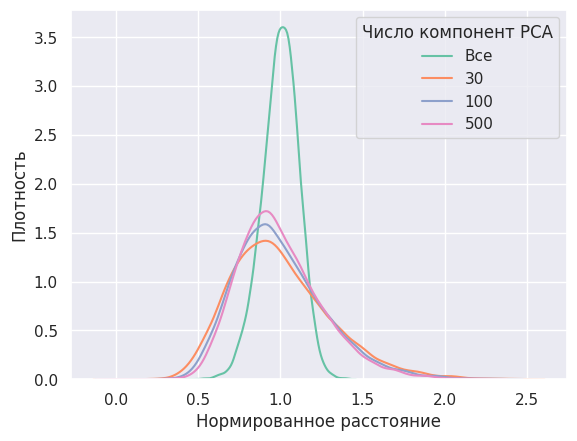

In [29]:
dimensions = [30, 100, 500]
sample_size = 15000
sample = np.random.choice(cats.shape[0], size=(2, sample_size))
samples = cats[sample]
sns.kdeplot(
    normalized_distance(np.linalg.norm(samples[0] - samples[1], axis=1)), label="Все"
)

for dim in dimensions:
    pca = PCA(n_components=dim)
    cats_projection = pca.fit_transform(cats.astype(np.float32))
    samples = cats_projection[sample]
    sns.kdeplot(
        normalized_distance(np.linalg.norm(samples[0] - samples[1], axis=1)), label=dim
    )

plt.legend(title="Число компонент PCA")
plt.xlabel("Нормированное расстояние")
plt.ylabel("Плотность")

Сделайте выводы
Пространство котиков является достаточно большим и для него возникает проклятие большой размерности. В тоже время с увеличением PCA мы приближаемся в целом к нашему распределению.

#### 2. Кластеризация котиков по вектору изображения

Начнем эксперименты с самого простого способа: каждое изображение можно вытянуть в вектор размерности $64 \cdot 64 \cdot 3$, их и попытаемся кластеризовать. Обучите по этим объектам метод KMeans из sklearn, пример можно посмотреть в <a href="https://thetahat.ru/courses/ad/main/7/clustering" target="_top">ноутбуке</a> по кластеризации

In [30]:
%%time
kmeans = KMeans(10, n_init="auto")
kmeans.fit(cats)
clusters = kmeans.predict(cats)

CPU times: user 1min 57s, sys: 1.65 s, total: 1min 58s
Wall time: 16 s


Теперь отобразим изображения на плоскость с помощью PCA и визуализируем полученные предсказания цветом, как это было сделано на <a href="https://thetahat.ru/courses/ad/main/7/clustering" target="_top">семинаре</a> для ответов на вопросы в бот. Ниже уже реализована функция отрисовки `visualize_images_clusterisation`, вам требуется лишь применить PCA и вызвать функцию с правильными параметрами.

> В процессе работы над заданием для детального исследования кластеров стоит передавать `use_dash=True`, в этом случае всё будет рисоваться со всплывающими картинками. А в конце, **перед сдачей работы, необходимо перерисовать графики с `use_dash=False`**, тогда они нарисуются с помощью простого plotly и сохранятся в ноутбуке
> 
> Если вы работаете в Colab, и с опцией `use_dash=False` у вас не отрисовывается график, попробуйте посмотреть решение проблемы <a href="https://stackoverflow.com/questions/47230817/plotly-notebook-mode-with-google-colaboratory" target="_top">тут</a>.
> 
> Если вы работаете в Jupyter Notebook, и у вас не отображаются графики, попробуйте нажать кнопку `Not Trusted` на верхней панели справа.
>
> Если совсем никак не получается, сохраните графики в html и отправьте боту.

In [ ]:

def visualize_images_clusterisation(
    images: np.ndarray,
    projection: np.ndarray,
    clusters: np.ndarray,
    port: Optional[int] = None,
    use_dash: bool = False,
) -> Optional[Dash]:
    """
    Визуализирует кластеризацию изображений с возможностью просмотра изображений при наведении.

    Создает интерактивный scatter plot проекции изображений с двумя режимами:
    1. Режим Jupyter (use_dash=False): показывает статичный plotly график
    2. Режим Dash (use_dash=True): запускает интерактивный сервер с hover-эффектом

    Параметры:
        images: Массив изображений формы (n_samples, height, width, channels)
        projection: 2D проекция эмбеддингов формы (n_samples, 2)
        clusters: Массив меток кластеров формы (n_samples,)
        port: Порт для запуска Dash-приложения (None - случайный порт)
        use_dash: Флаг использования интерактивного Dash-режима

    Возвращает:
        При use_dash=True возвращает Dash приложение, иначе None
    """

    plotly.offline.init_notebook_mode()

    # Рисуем график с точками как на семинаре
    fig = px.scatter(
        x=projection[:, 0],
        y=projection[:, 1],
        hover_name=clusters,
        hover_data={"image_idx": list(range(len(images)))},
        color=clusters.astype(str),
        width=1000,
        height=800,
        title="PCA проекция изображений на плоскость",
        size=[1] * len(images),
        size_max=12,
    )

    if not use_dash:
        fig.show()
        return

    # Добавляем во всплывающее окошко (hover box) изображения
    fig.update_traces(
        hoverinfo="none",
        hovertemplate=None,
    )

    app = Dash(__name__)

    app.layout = html.Div(
        className="container",
        children=[
            dcc.Graph(id="graph-2-dcc", figure=fig, clear_on_unhover=True),
            dcc.Tooltip(id="graph-tooltip-2", direction="bottom"),
        ],
    )

    @callback(
        Output("graph-tooltip-2", "show"),
        Output("graph-tooltip-2", "bbox"),
        Output("graph-tooltip-2", "children"),
        Output("graph-tooltip-2", "direction"),
        Input("graph-2-dcc", "hoverData"),
    )
    def display_hover(
        hoverData: Optional[Dict],
    ) -> Tuple[bool, Union[Dict, str], List[html.Img], str]:
        """
        Callback функция для обработки hover-событий и отображения изображений во всплывающем окне.

        Параметры:
            hoverData: Данные о точке, на которую наведен курсор. Содержит:
                      - coordinates (координаты точки)
                      - pointIndex (индекс точки)
                      - bbox (границы точки)
                      - customdata (дополнительные данные)

        Возвращает кортеж:
            1. Флаг показа/скрытия tooltip (bool)
            2. Bounding box точки (dict) или no_update
            3. Список HTML-элементов для отображения (List[html.Img])
            4. Направление отображения tooltip (str)
        """
        if hoverData is None:
            return False, no_update, no_update, no_update

        # Достаем индекс картинки, который выше положили в hover_data
        hover_data = hoverData["points"][0]
        image_idx = hover_data["customdata"][0]
        # И получаем само изображение кота
        image = Image.fromarray(images[image_idx].reshape(64, 64, 3))

        # Преобразовываем изображение в base64 кодировку
        buffer = io.BytesIO()
        image.save(buffer, format="jpeg")
        encoded_image = base64.b64encode(buffer.getvalue()).decode()
        image_url = "data:image/jpeg;base64, " + encoded_image

        image_children = [
            html.Img(
                src=image_url,
                style={"width": "196px"},
            ),
        ]

        return True, hover_data["bbox"], image_children, "top"

    if port is None:
        port = str(np.random.randint(5000, 15000))
    app.run(port=port, debug=True, jupyter_height=800)

    return app

In [46]:
pca = PCA(n_components=2)
cats_projection = pca.fit_transform(cats.astype(np.float32))
visualize_images_clusterisation(cats, cats_projection, clusters, use_dash=False)

Для каждого кластера нарисуйте по 5-10 типичных изображений, то есть ближайших к центру кластера. Похожую операцию мы видели на занятии в <a href="https://thetahat.ru/courses/ad/main/7/clustering" target="_top">ноутбуке</a> по кластеризации.

*Примечание.* Для одного кластера рисуйте картинки "в строчку". Так будет удобно как вам самим, так и проверяющему. Примеры можно посмотреть в <a href="https://thetahat.ru/courses/ad/main/7/pca" target="_top">ноутбуке</a> по PCA.

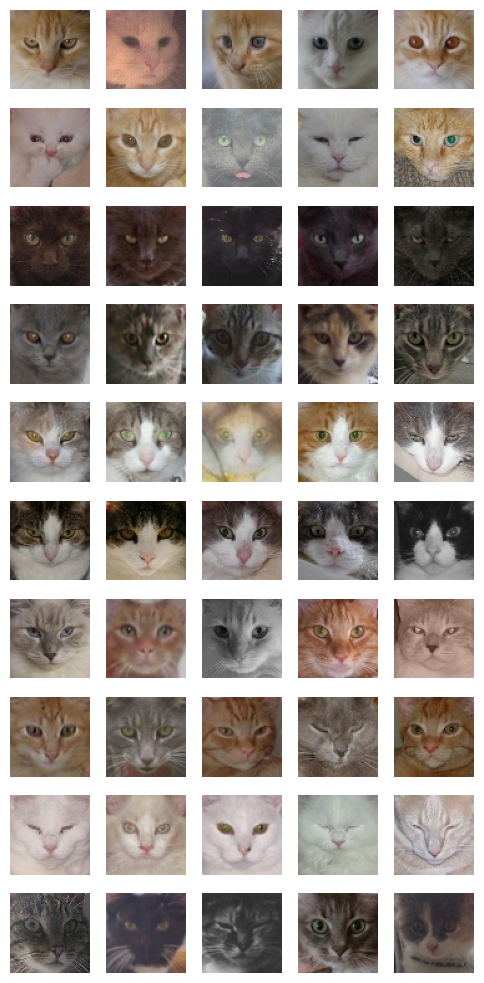

In [33]:
plt.figure(figsize=(5, 10))
idx = 1
for cluster in np.unique(clusters):
    cluster_points = pd.DataFrame(cats).loc[clusters == cluster]

    cluster_center = cluster_points.mean(axis=0)

    # Считаем расстояния до центра от каждой точки кластера
    distances = cluster_points.apply(
        lambda x: np.linalg.norm(cluster_center - x), axis=1
    )
    # Берем топ-5 уникальных ответов, соответствующих полученным индексам
    closest_answers = distances.sort_values().index
    for pic in cluster_points.loc[closest_answers].drop_duplicates()[:5].to_numpy():
        plt.subplot(10, 5, idx)
        plt.imshow(pic.reshape(64, 64, 3))
        plt.axis("off")
        idx += 1
plt.tight_layout()
plt.show()

Наблюдаются ли какие-то закономерности в изображениях внутри одного кластера? Если да, то опишите отличительные черты кластеров.

Да, при кластеризации изображений котов наблюдаются определённые закономерности, отражающие визуальные особенности изображений. Ниже представлены формализованные описания десяти кластеров:

---

Описание кластеров
1. **Серые коты с белым подбородком**:Изображения котов с преимущественно серым окрасом шерсти и выраженным белым участком в области подбородка

2. **Тёмные коты с белым подбородком**:Коты с тёмным (чёрным или тёмно-коричневым) окрасом шерсти, имеющие светлые участки в области подбородка

3. **Коты на тёмном фоне с яркими глазами**:Изображения, где коты расположены на тёмном фоне, что подчёркивает яркость их глаз

4. **Котята**:Молодые коты с характерными чертами, такими как меньший размер тела и более мягкие черты лица

5. **Коты на светлом фоне с яркими глазами**:Изображения котов на светлом фоне, где акцент сделан на яркость их глаз

6. **Оранжевые коты**:Коты с рыжим или оранжевым окрасом шерсти

7. **Серые коты с ярко выраженным белым подбородком**:Серые коты, у которых белый подбородок выделяется особенно сильно на фоне остальной шерсти

8. **Чёрные коты**:Коты с полностью чёрным окрасом шерсти

9. **Коты, смотрящие вбок**:Изображения котов, повернувших голову в сторону, что создаёт специфическую композицию кадра

10. **Белые коты**:Коты с преимущественно белым окрасом шерсти

---
Подумайте, чем может быть плох такой подход? Какая проблема могла возникнуть и возникла ли? Обратите внимание на проведенное ранее исследование.


### Проблемы подхода
Несмотря на выявленные закономерности, подход, основанный на визуальных характеристиках изображений, имеет ряд ограничений

- **Влияние внешних факторов**:Освещение, фон и качество изображения могут существенно влиять на результаты кластеризации, приводя к объединению визуально схожих, но семантически разных изображений

- **Проклятие размерности**:В высокоразмерных пространствах расстояния между точками становятся менее информативными, что затрудняет эффективную кластеризацию

- **Ограничения методов снижения размерности**:Методы, такие как PCA, могут терять важную информацию, особенно если она не связана с наибольшей дисперсией в данных
Для более надёжной кластеризации рекомендуется использовать более устойчивые методы извлечения признаков, например, предобученные нейронные сети, и алгоритмы кластеризации, учитывающие сложные структуры данных